In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

2023-10-29 08:21:09.036103: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-29 08:21:09.076079: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-10-29 08:21:09.316950: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-29 08:21:09.317007: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-29 08:21:09.318407: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to regi

In [2]:
rd_state = 666

In [3]:
from sklearn.model_selection import train_test_split

all_data = pd.read_csv("train.csv")
challenge_input = pd.read_csv("test.csv")
challenge_labels = challenge_input['label']
challenge_input = challenge_input.drop('label', axis=1)

# Normalize pixel values in [0,1]
all_data.loc[:, all_data.columns != 'label'] = all_data.loc[:, all_data.columns != 'label']/255
challenge_input = challenge_input/255

all_input = all_data.drop('label', axis=1)
all_labels = all_data['label'].copy()

# Extract a validation set
train_input, validate_input, train_labels, validate_labels = train_test_split(all_input, all_labels, test_size=0.05, random_state=rd_state)

# Extract a testing set
train_input, test_input, train_labels, test_labels = train_test_split(train_input, train_labels, test_size=0.10, random_state=rd_state)

train_both = train_input.copy()
train_both['label'] = train_labels

# Sanity check
print("All data:  %s" % (all_data.shape,))
print("All input: %s" % (all_input.shape,))
print("Training:  %s" % (train_input.shape,))
print("Test set:  %s" % (test_input.shape,))
print("Validate:  %s" % (validate_input.shape,))
print("Challenge: %s" % (challenge_input.shape,))

All data:  (60000, 785)
All input: (60000, 784)
Training:  (51300, 784)
Test set:  (5700, 784)
Validate:  (3000, 784)
Challenge: (10000, 784)


In [4]:
labels = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]

def label_str(label):
    return labels[label]

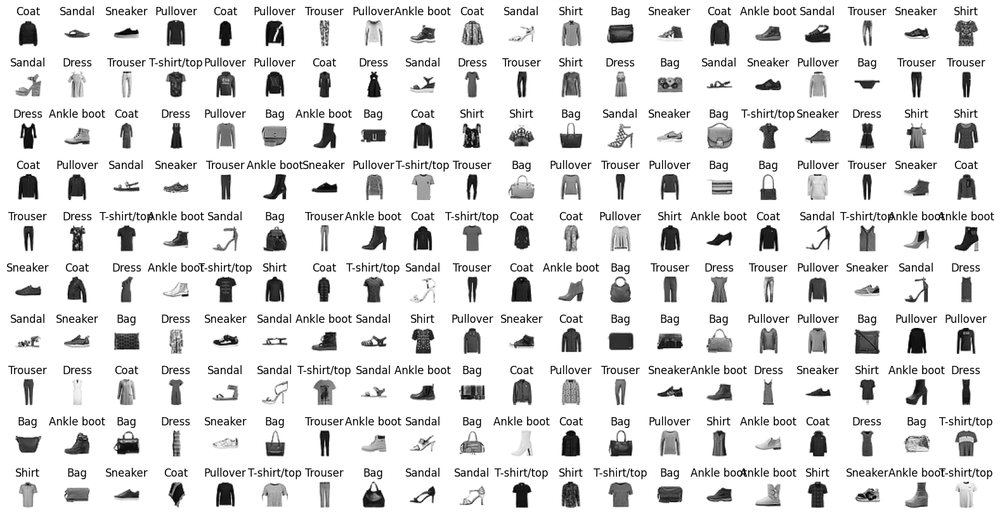

In [5]:
def show_items(inp, X, Y, label=None, labels=None, true_labels=None):
    fX = 20
    fY = int(fX*Y/X)

    figure, axis = plt.subplots(max(Y, 2), max(X, 2), figsize=(fX,fY))
    if label is not None:
        if not isinstance(label, str):
            label = label_str(label)
        figure.suptitle(label, y=0.9)
    plt.subplots_adjust(wspace=0.1, hspace=1)
    for x in range(X):
        for y in range(Y):
            axis[y, x].imshow(inp.iloc[y*X+x].to_numpy().reshape(28, 28), cmap='gray_r')
            axis[y, x].axis('off')
            if labels is not None:
                if true_labels is not None:
                    axis[y, x].set_title(label_str(labels[y*X+x]) + " != " + label_str(true_labels[y*X+x]))
                else:
                    axis[y, x].set_title(label_str(labels[y*X+x]))

# Let's peek at some random digits
show_items(train_input, 20, 10, labels=train_labels.to_numpy())

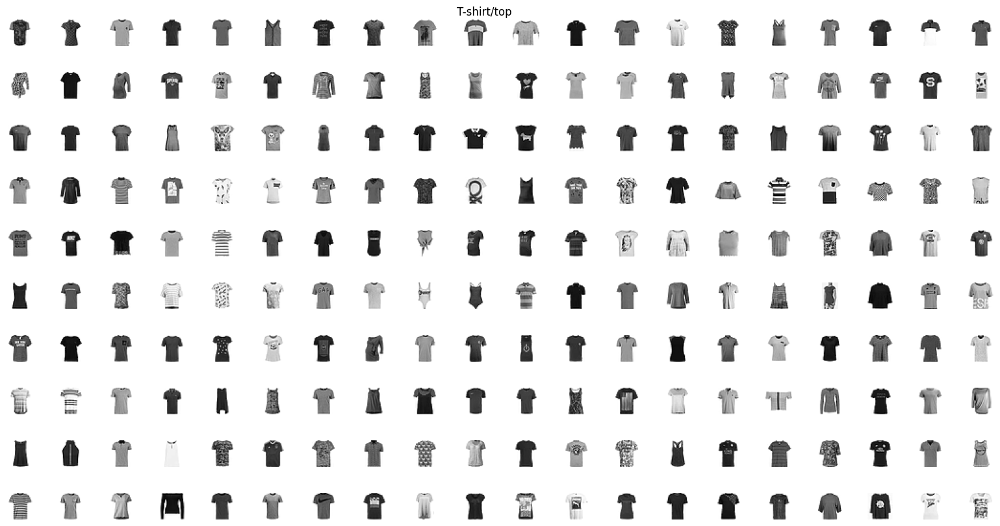

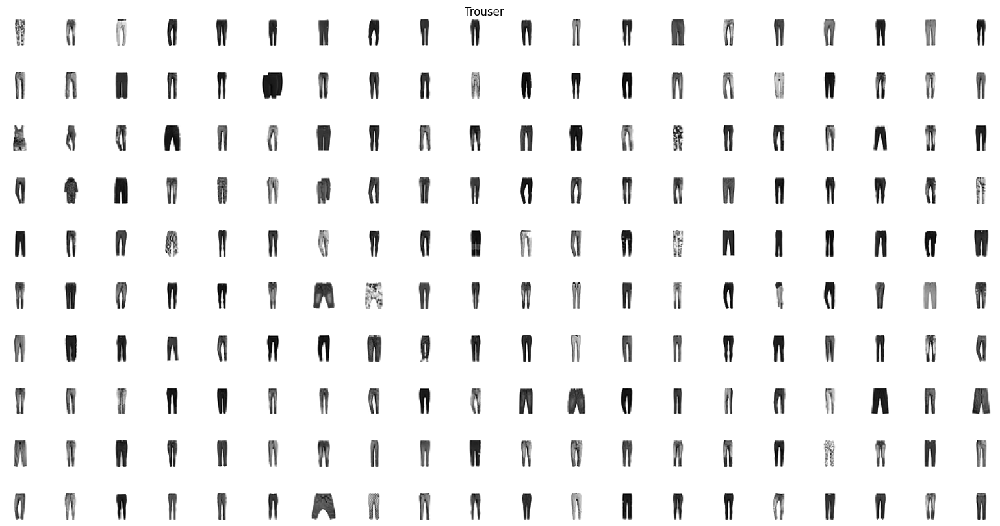

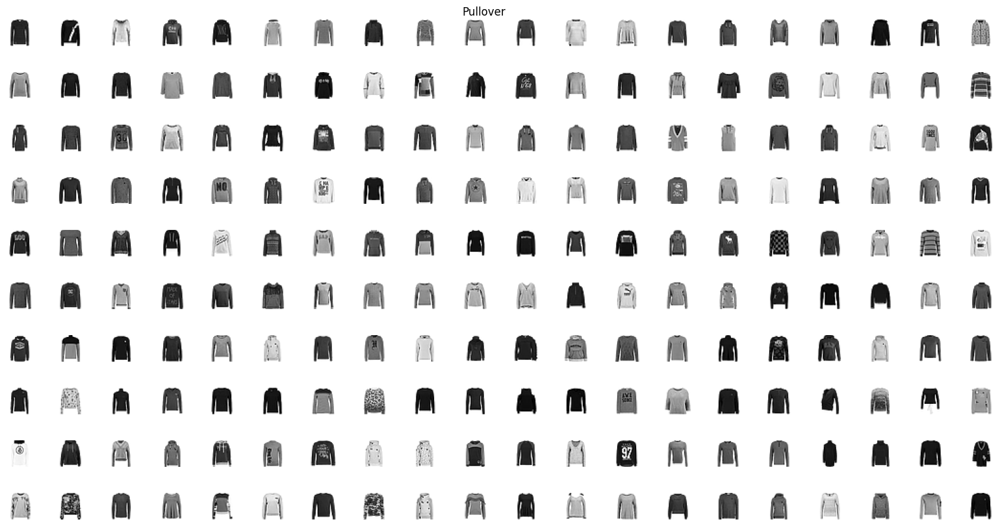

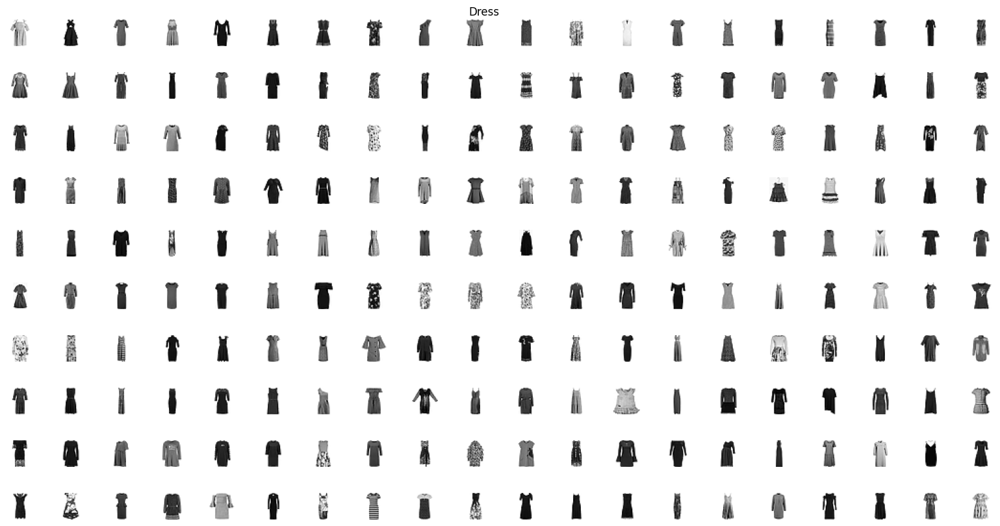

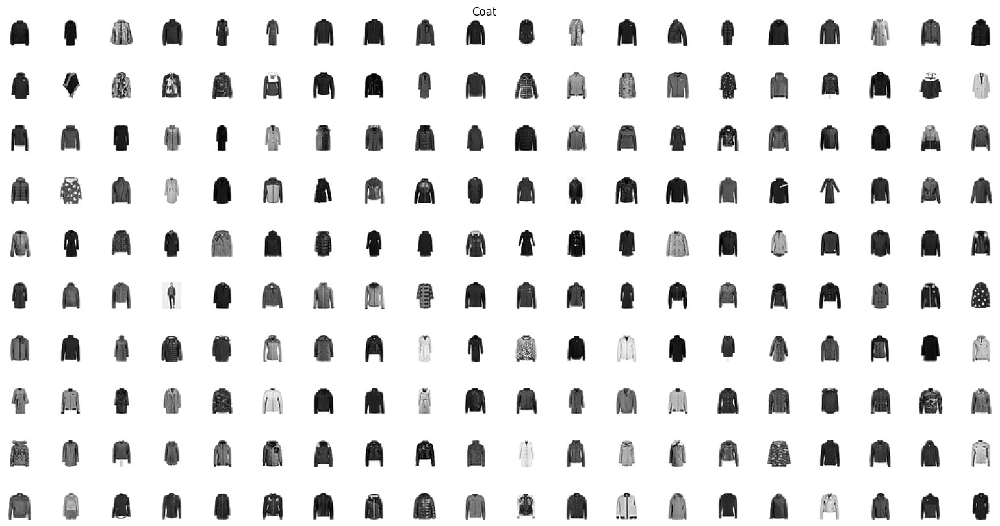

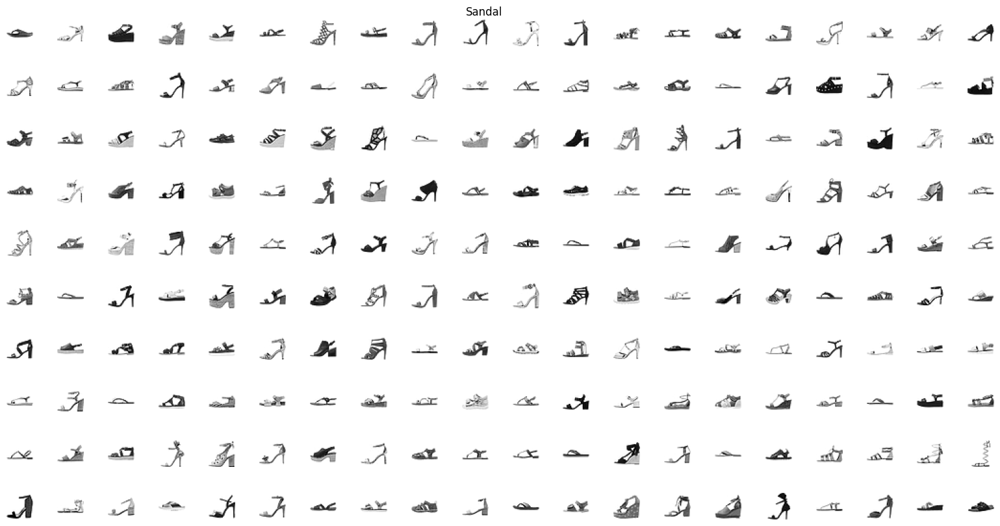

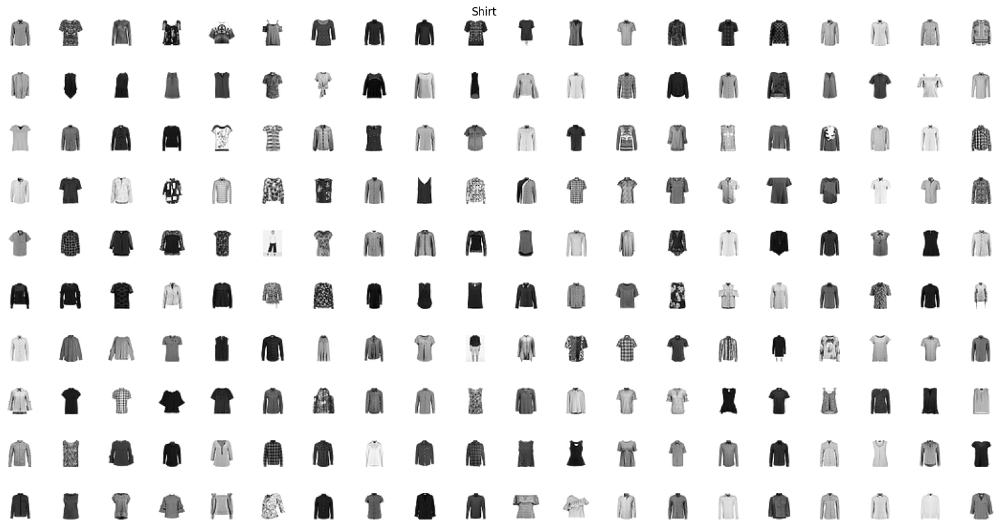

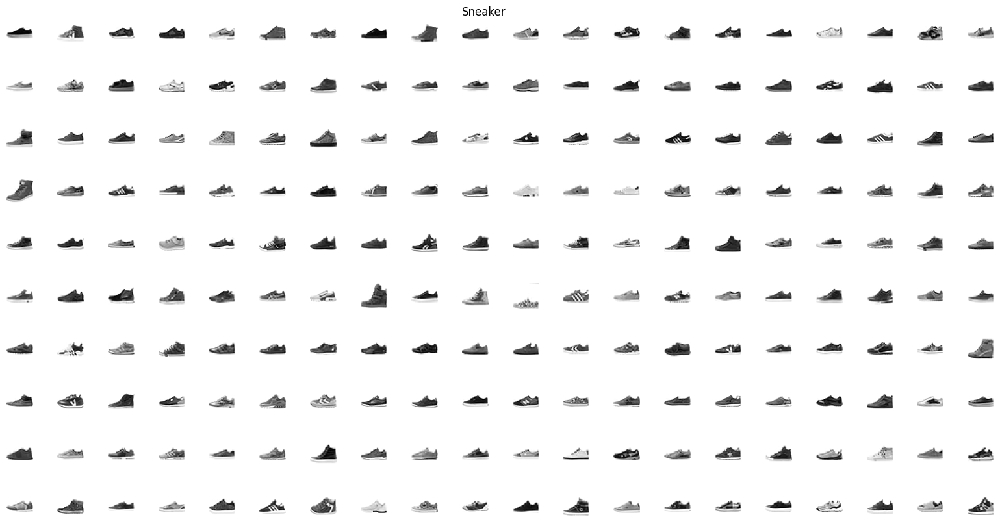

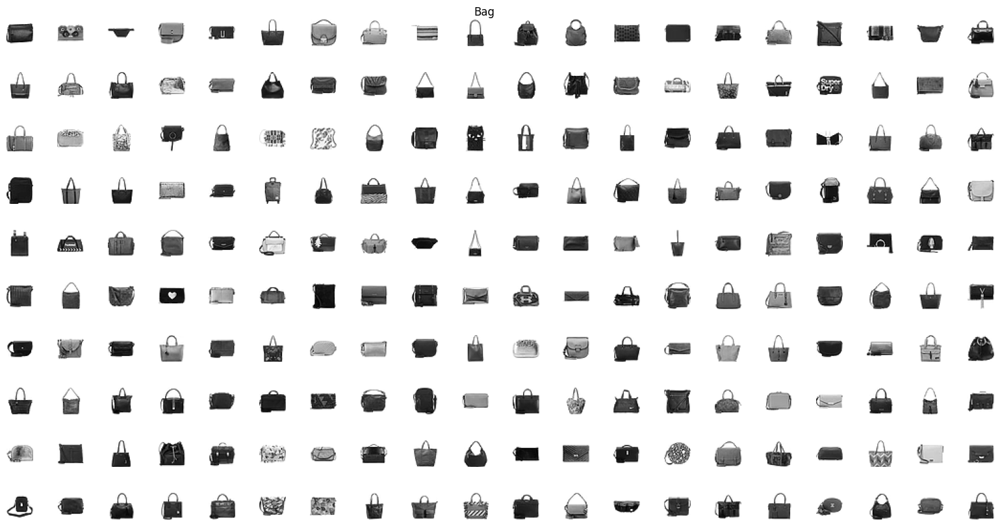

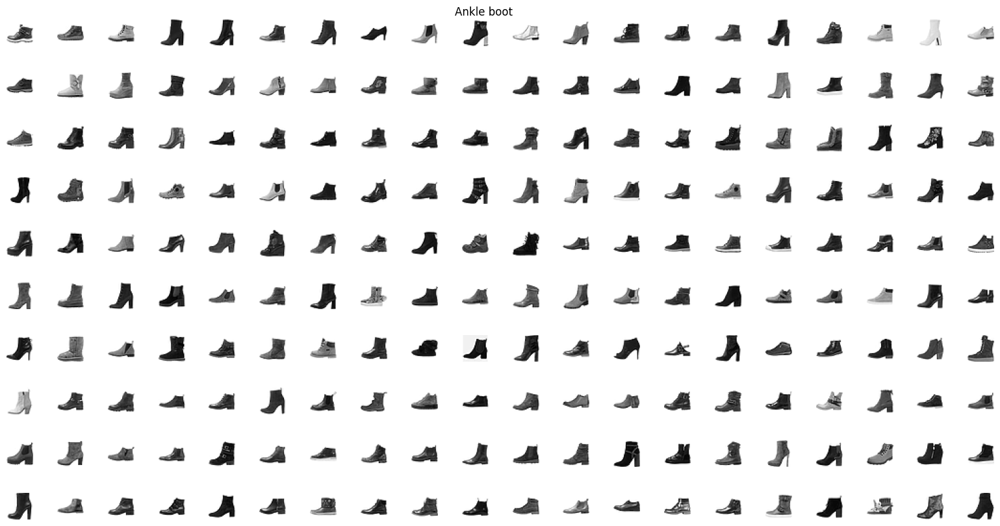

In [6]:
# Let's peek at some digits of each category
for i in range(10):
    show_items(train_input[train_both["label"] == i], 20, 10, label=i)

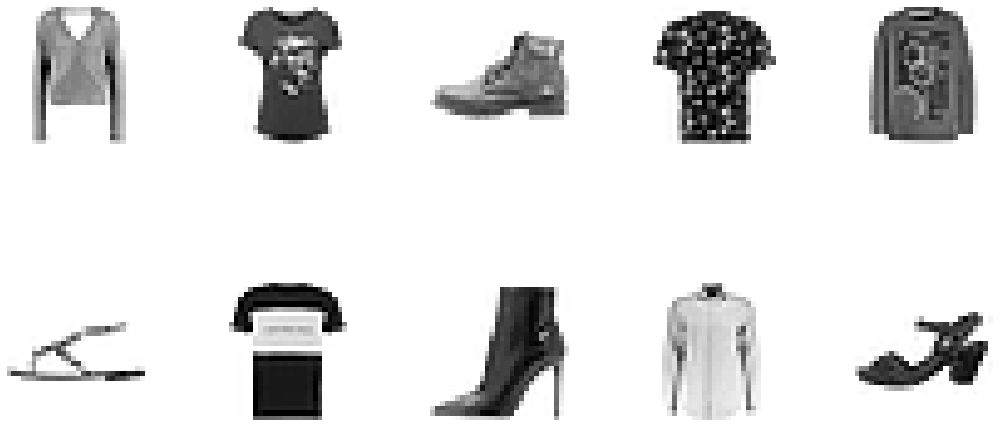

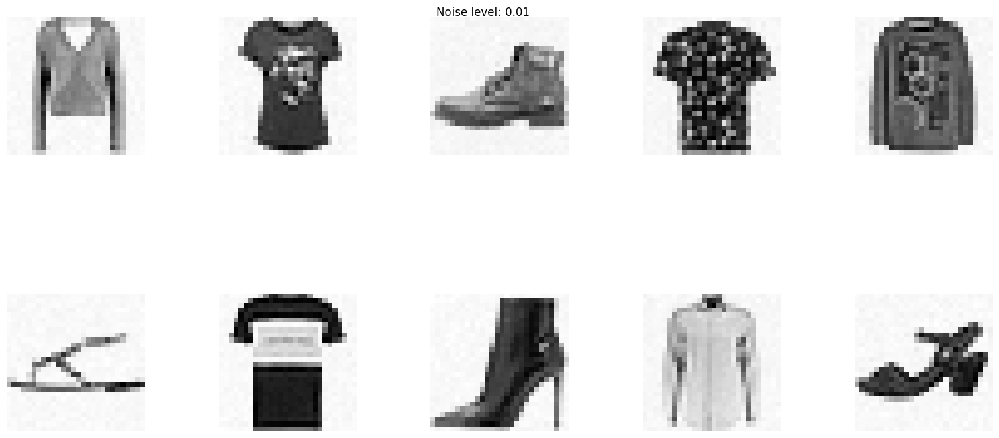

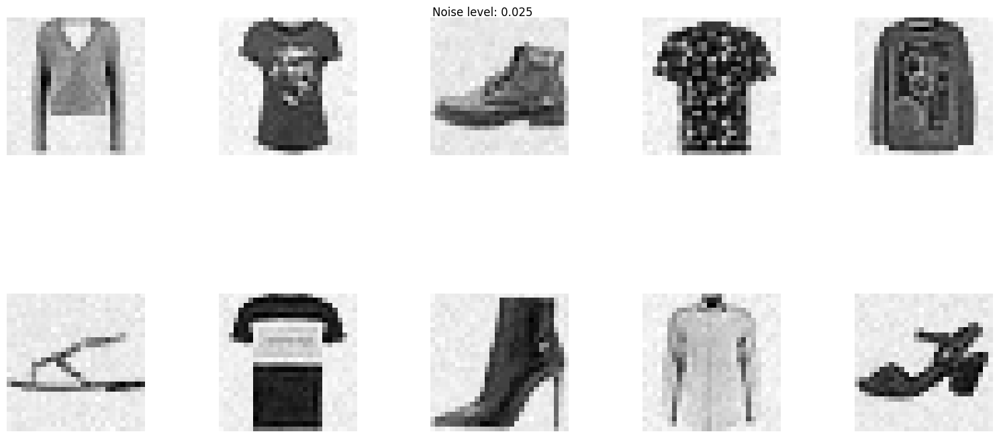

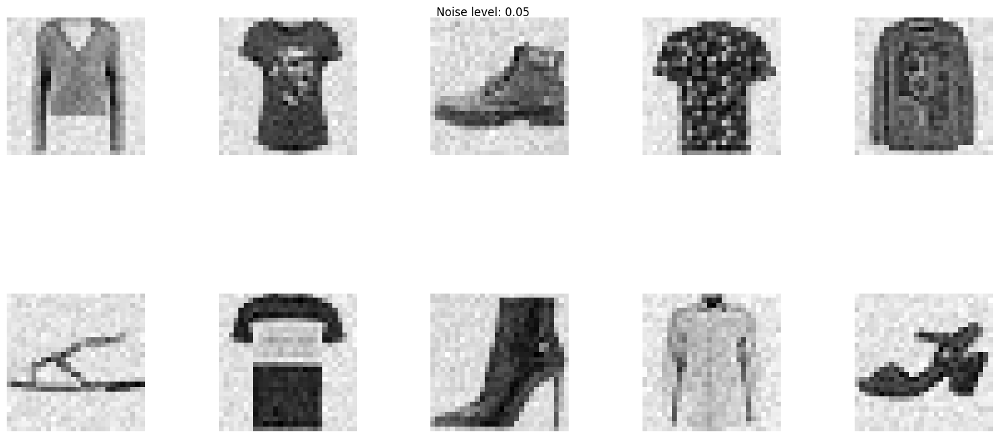

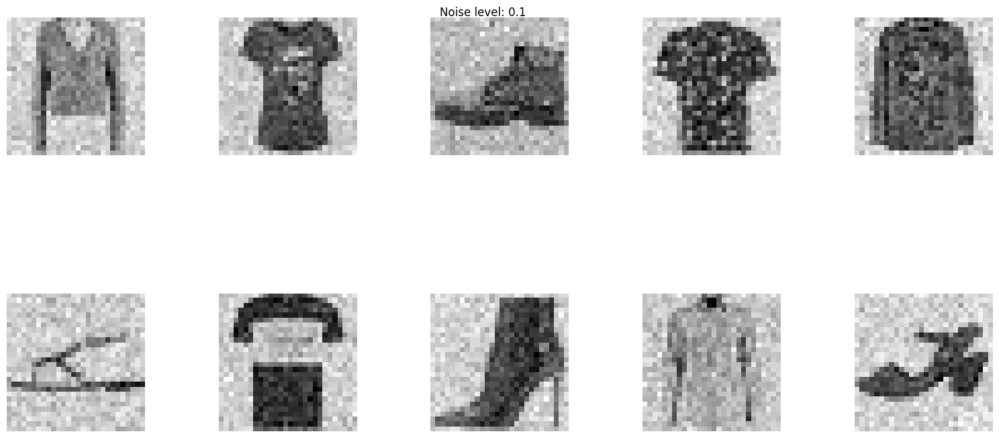

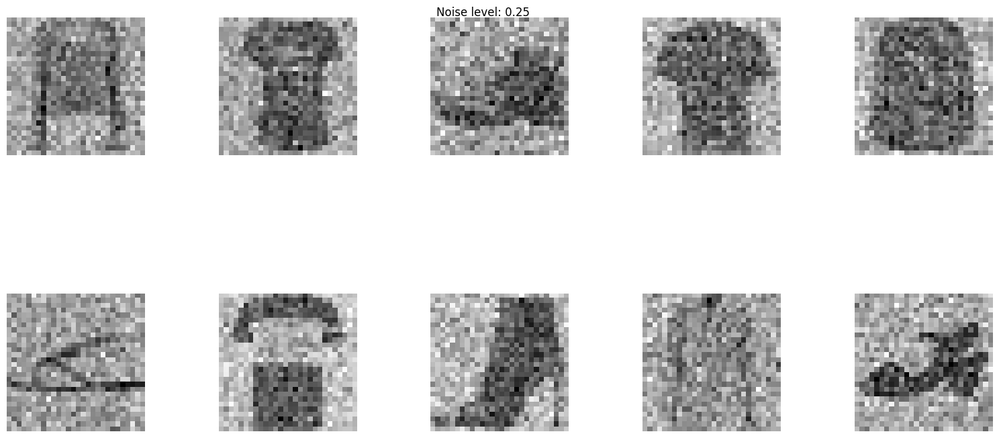

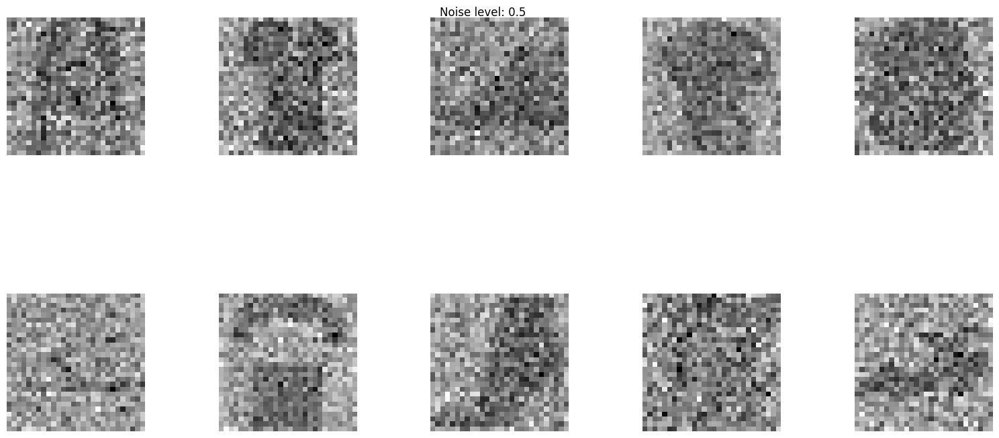

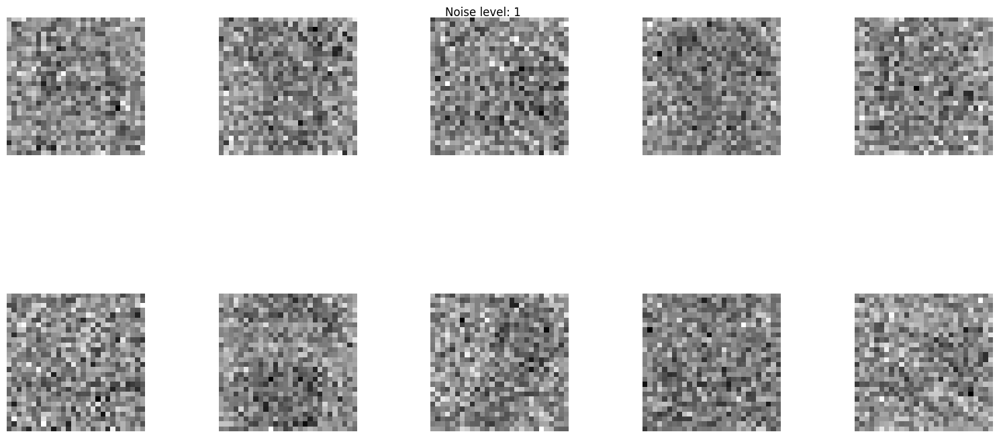

In [7]:
# Problematic instances?
# https://www.kaggle.com/datasets/zalando-research/fashionmnist/discussion/42939
# 1071: reflection of the cloth on the bottom of the image
# 3671: reflection of the cloth on the bottom of the image
# 4382: rotated cloth
# 5184: picture of a model instead of the cloth
# 5705: picture of a model instead of the cloth
# 6491: rotated cloth? one sleeve is missing
# 8812: two cloths in the same picture

bad_instances=[1070,1071,1072,3671,4382,5184,5705,6491,8812,8900]
samples = all_input.loc[bad_instances]

show_items(samples, 5, 2)

# Checking what kind of gaussian noise is too much
for n in [0.01, 0.025, 0.05, 0.1, 0.25, 0.5, 1]:
    noised = samples.copy()
    noise = np.random.normal(0, n, [len(bad_instances),28*28])
    
    noised = noised + noise
    show_items(noised, 5, 2, label="Noise level: %s" % n)

In [8]:
# function to plot the learning curves
def plot_results(history):
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))

    ax1.plot(history['loss'], label="Train loss")
    if 'val_loss' in history:
        ax1.plot(history['val_loss'], label="Validation loss")
    ax2.plot(history['accuracy'], label="Train accuracy")
    if 'val_accuracy' in history:
        ax2.plot(history['val_accuracy'], label="Validation accuracy")

    ax1.legend(fontsize=15);
    ax2.legend(fontsize=15);

    ax1.set_title('Loss per epoch', fontsize=25);
    ax1.set_xlabel("epoch", fontsize=20);
    ax2.set_title('Accuracy per epoch', fontsize=25);
    ax2.set_xlabel("epoch", fontsize=20);

    ax1.grid(True)
    ax2.grid(True);

In [ ]:
# Train a predictor

# Simple feed-forward network
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(784,)),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.GaussianNoise(0.1),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.GaussianNoise(0.1),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10)
])

display("FF model summary:")
model.summary()

# A convolution neural network
model = tf.keras.Sequential([
    tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
    tf.keras.layers.GaussianNoise(0.1),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), input_shape=[28,28,1], padding="same", activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding="valid"),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), padding="same", activation='relu'),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(120, activation='relu'),
    tf.keras.layers.Dense(10)
])
variability = 0.05
model = tf.keras.Sequential([
    tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
    tf.keras.layers.RandomFlip(mode="horizontal"),
    tf.keras.layers.RandomRotation((-variability, variability), fill_mode="nearest", interpolation="nearest"),
    tf.keras.layers.RandomTranslation((-variability, variability), (-variability, variability), fill_mode="nearest", interpolation="nearest"),
    tf.keras.layers.RandomZoom((-variability, variability), fill_mode="nearest", interpolation="nearest"),
    tf.keras.layers.RandomContrast(variability),
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3), input_shape=[28,28,1], padding="same", activation="relu"),
    #tf.keras.layers.BatchNormalization(),
    #tf.keras.layers.ReLU(),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding="valid"),
    tf.keras.layers.GaussianNoise(variability),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"),
    #tf.keras.layers.BatchNormalization(),
    #tf.keras.layers.ReLU(),
    tf.keras.layers.MaxPool2D(pool_size=2, strides=2, padding="valid"),
    tf.keras.layers.GaussianNoise(variability),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation="relu"),
    #tf.keras.layers.BatchNormalization(),
    #tf.keras.layers.ReLU(),
    tf.keras.layers.Dense(10)
])

display("CNN model summary:")
model.summary()

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_input, train_labels, epochs=500, validation_data=(challenge_input, challenge_labels))

test_loss, test_acc = model.evaluate(test_input,  test_labels, verbose=2)

print('\nTest accuracy:', test_acc)

'FF model summary:'

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 784)               0         
                                                                 
 dense_7 (Dense)             (None, 128)               100480    
                                                                 
 gaussian_noise_5 (Gaussian  (None, 128)               0         
 Noise)                                                          
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 128)               16512     
                                                                 
 gaussian_noise_6 (Gaussian  (None, 128)               0         
 Noise)                                               

'CNN model summary:'

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_3 (Reshape)         (None, 28, 28, 1)         0         
                                                                 
 random_flip_1 (RandomFlip)  (None, 28, 28, 1)         0         
                                                                 
 random_rotation_1 (RandomR  (None, 28, 28, 1)         0         
 otation)                                                        
                                                                 
 random_translation_1 (Rand  (None, 28, 28, 1)         0         
 omTranslation)                                                  
                                                                 
 random_zoom_1 (RandomZoom)  (None, 28, 28, 1)         0         
                                                                 
 random_contrast_1 (RandomC  (None, 28, 28, 1)        

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 78s 48ms/step - loss: 0.1837 - accuracy: 0.9323 - val_loss: 0.2214 - val_accuracy: 0.9298
Epoch 119/500
1604/1604 [==============================] - 65s 40ms/step - loss: 0.1769 - accuracy: 0.9352 - val_loss: 0.2336 - val_accuracy: 0.9251
Epoch 121/500
1604/1604 [==============================] - 66s 41ms/step - loss: 0.1819 - accuracy: 0.9335 - val_loss: 0.2219 - val_accuracy: 0.9297
Epoch 122/500
1604/1604 [==============================] - 75s 47ms/step - loss: 0.1819 - accuracy: 0.9330 - val_loss: 0.2280 - val_accuracy: 0.9296
Epoch 123/500
 803/1604 [==============>...............] - ETA: 32s - loss: 0.1821 - accuracy: 0.9339

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 66s 41ms/step - loss: 0.1759 - accuracy: 0.9347 - val_loss: 0.2268 - val_accuracy: 0.9283
Epoch 129/500
1604/1604 [==============================] - 76s 47ms/step - loss: 0.1758 - accuracy: 0.9349 - val_loss: 0.2241 - val_accuracy: 0.9299
Epoch 131/500
1604/1604 [==============================] - 76s 47ms/step - loss: 0.1791 - accuracy: 0.9345 - val_loss: 0.2289 - val_accuracy: 0.9337
Epoch 132/500
1604/1604 [==============================] - 57s 35ms/step - loss: 0.1783 - accuracy: 0.9332 - val_loss: 0.2216 - val_accuracy: 0.9291
Epoch 133/500
 874/1604 [===============>..............] - ETA: 23s - loss: 0.1748 - accuracy: 0.9363

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 15028s 9s/step - loss: 0.1703 - accuracy: 0.9372 - val_loss: 0.2223 - val_accuracy: 0.9301
Epoch 150/500
1604/1604 [==============================] - 76s 47ms/step - loss: 0.1758 - accuracy: 0.9353 - val_loss: 0.2166 - val_accuracy: 0.9305
Epoch 152/500
1604/1604 [==============================] - 104s 65ms/step - loss: 0.1748 - accuracy: 0.9352 - val_loss: 0.2237 - val_accuracy: 0.9298
Epoch 153/500
1604/1604 [==============================] - 65s 41ms/step - loss: 0.1651 - accuracy: 0.9391 - val_loss: 0.2156 - val_accuracy: 0.9318
Epoch 155/500
1604/1604 [==============================] - 63s 39ms/step - loss: 0.1745 - accuracy: 0.9344 - val_loss: 0.2445 - val_accuracy: 0.9263
Epoch 156/500
1604/1604 [==============================] - 59s 37ms/step - loss: 0.1725 - accuracy: 0.9363 - val_loss: 0.2409 - val_accuracy: 0.9231
Epoch 157/500
1377/1604 [========================>.....] - ETA: 5s - loss: 0.1707 - accuracy: 0.9378

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 42s 26ms/step - loss: 0.1708 - accuracy: 0.9372 - val_loss: 0.2536 - val_accuracy: 0.9254
Epoch 160/500
1604/1604 [==============================] - 45s 28ms/step - loss: 0.1723 - accuracy: 0.9358 - val_loss: 0.2419 - val_accuracy: 0.9296
Epoch 162/500
1604/1604 [==============================] - 42s 26ms/step - loss: 0.1714 - accuracy: 0.9371 - val_loss: 0.2200 - val_accuracy: 0.9325
Epoch 163/500
1604/1604 [==============================] - 38s 24ms/step - loss: 0.1696 - accuracy: 0.9382 - val_loss: 0.2248 - val_accuracy: 0.9304
Epoch 164/500
1604/1604 [==============================] - 42s 26ms/step - loss: 0.1710 - accuracy: 0.9366 - val_loss: 0.2178 - val_accuracy: 0.9312
Epoch 165/500
1604/1604 [==============================] - 42s 26ms/step - loss: 0.1706 - accuracy: 0.9373 - val_loss: 0.2537 - val_accuracy: 0.9260
Epoch 166/500
1415/1604 [=========================>....] - ETA: 4s - loss: 0.1682 - accuracy: 0.9376

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 47s 29ms/step - loss: 0.1690 - accuracy: 0.9372 - val_loss: 0.2285 - val_accuracy: 0.9303
Epoch 175/500
1604/1604 [==============================] - 41s 26ms/step - loss: 0.1665 - accuracy: 0.9391 - val_loss: 0.2318 - val_accuracy: 0.9314
Epoch 177/500
1604/1604 [==============================] - 40s 25ms/step - loss: 0.1679 - accuracy: 0.9383 - val_loss: 0.2222 - val_accuracy: 0.9292
Epoch 178/500
1604/1604 [==============================] - 37s 23ms/step - loss: 0.1683 - accuracy: 0.9375 - val_loss: 0.2364 - val_accuracy: 0.9305
Epoch 179/500
1604/1604 [==============================] - 37s 23ms/step - loss: 0.1698 - accuracy: 0.9386 - val_loss: 0.2332 - val_accuracy: 0.9272
Epoch 180/500
1604/1604 [==============================] - 38s 24ms/step - loss: 0.1675 - accuracy: 0.9380 - val_loss: 0.2300 - val_accuracy: 0.9296
Epoch 181/500
1512/1604 [===========================>..] - ETA: 2s - loss: 0.1690 - accuracy: 0.9378

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 44s 27ms/step - loss: 0.1650 - accuracy: 0.9388 - val_loss: 0.2390 - val_accuracy: 0.9299
Epoch 192/500
1604/1604 [==============================] - 44s 27ms/step - loss: 0.1629 - accuracy: 0.9395 - val_loss: 0.2462 - val_accuracy: 0.9287
Epoch 193/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1668 - accuracy: 0.9393 - val_loss: 0.2599 - val_accuracy: 0.9260
Epoch 194/500
1604/1604 [==============================] - 33s 21ms/step - loss: 0.1647 - accuracy: 0.9392 - val_loss: 0.2333 - val_accuracy: 0.9286
Epoch 195/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1639 - accuracy: 0.9391 - val_loss: 0.2284 - val_accuracy: 0.9348
Epoch 196/500
 777/1604 [=============>................] - ETA: 16s - loss: 0.1671 - accuracy: 0.9383

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 34s 21ms/step - loss: 0.1648 - accuracy: 0.9407 - val_loss: 0.2465 - val_accuracy: 0.9278
Epoch 205/500
1604/1604 [==============================] - 36s 22ms/step - loss: 0.1644 - accuracy: 0.9405 - val_loss: 0.2318 - val_accuracy: 0.9286
Epoch 208/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1634 - accuracy: 0.9403 - val_loss: 0.2474 - val_accuracy: 0.9287
Epoch 209/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1642 - accuracy: 0.9401 - val_loss: 0.2398 - val_accuracy: 0.9292
Epoch 210/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1621 - accuracy: 0.9409 - val_loss: 0.2464 - val_accuracy: 0.9252
Epoch 211/500
1604/1604 [==============================] - 33s 21ms/step - loss: 0.1556 - accuracy: 0.9426 - val_loss: 0.2521 - val_accuracy: 0.9273
Epoch 212/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1656 - accuracy: 0.9397 - val_loss: 0

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 38s 24ms/step - loss: 0.1584 - accuracy: 0.9423 - val_loss: 0.2552 - val_accuracy: 0.9258
Epoch 222/500
1604/1604 [==============================] - 33s 21ms/step - loss: 0.1596 - accuracy: 0.9411 - val_loss: 0.2768 - val_accuracy: 0.9264
Epoch 225/500
1604/1604 [==============================] - 35s 22ms/step - loss: 0.1584 - accuracy: 0.9418 - val_loss: 0.2283 - val_accuracy: 0.9292
Epoch 226/500
1604/1604 [==============================] - 35s 22ms/step - loss: 0.1639 - accuracy: 0.9403 - val_loss: 0.2432 - val_accuracy: 0.9266
Epoch 227/500
1604/1604 [==============================] - 33s 21ms/step - loss: 0.1619 - accuracy: 0.9407 - val_loss: 0.2415 - val_accuracy: 0.9286
Epoch 228/500
1604/1604 [==============================] - 33s 21ms/step - loss: 0.1615 - accuracy: 0.9402 - val_loss: 0.2406 - val_accuracy: 0.9315
Epoch 241/500
1604/1604 [==============================] - 34s 21ms/step - loss: 0.1615 - accuracy: 0.9398 - val_loss: 0

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 52s 33ms/step - loss: 0.1598 - accuracy: 0.9415 - val_loss: 0.2482 - val_accuracy: 0.9299
Epoch 251/500
1604/1604 [==============================] - 50s 31ms/step - loss: 0.1545 - accuracy: 0.9433 - val_loss: 0.2289 - val_accuracy: 0.9314
Epoch 252/500
1604/1604 [==============================] - 46s 29ms/step - loss: 0.1602 - accuracy: 0.9422 - val_loss: 0.2479 - val_accuracy: 0.9321
Epoch 253/500
1604/1604 [==============================] - 52s 33ms/step - loss: 0.1582 - accuracy: 0.9426 - val_loss: 0.2557 - val_accuracy: 0.9277
Epoch 254/500
 356/1604 [=====>........................] - ETA: 39s - loss: 0.1482 - accuracy: 0.9444

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 48s 30ms/step - loss: 0.1630 - accuracy: 0.9409 - val_loss: 0.2512 - val_accuracy: 0.9275
Epoch 265/500
1604/1604 [==============================] - 58s 36ms/step - loss: 0.1547 - accuracy: 0.9425 - val_loss: 0.2587 - val_accuracy: 0.9305
Epoch 266/500
1604/1604 [==============================] - 40s 25ms/step - loss: 0.1572 - accuracy: 0.9432 - val_loss: 0.2555 - val_accuracy: 0.9297
Epoch 267/500
1604/1604 [==============================] - 39s 24ms/step - loss: 0.1562 - accuracy: 0.9413 - val_loss: 0.2567 - val_accuracy: 0.9296
Epoch 268/500
1604/1604 [==============================] - 40s 25ms/step - loss: 0.1594 - accuracy: 0.9411 - val_loss: 0.2514 - val_accuracy: 0.9286
Epoch 269/500
 264/1604 [===>..........................] - ETA: 31s - loss: 0.1536 - accuracy: 0.9429

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1604/1604 [==============================] - 42s 26ms/step - loss: 0.1597 - accuracy: 0.9424 - val_loss: 0.2492 - val_accuracy: 0.9299
Epoch 278/500
1604/1604 [==============================] - 40s 25ms/step - loss: 0.1590 - accuracy: 0.9420 - val_loss: 0.2649 - val_accuracy: 0.9258
Epoch 280/500
1604/1604 [==============================] - 39s 25ms/step - loss: 0.1560 - accuracy: 0.9434 - val_loss: 0.2810 - val_accuracy: 0.9252
Epoch 281/500
1604/1604 [==============================] - 41s 26ms/step - loss: 0.1566 - accuracy: 0.9431 - val_loss: 0.2496 - val_accuracy: 0.9302
Epoch 282/500
1604/1604 [==============================] - 46s 29ms/step - loss: 0.1596 - accuracy: 0.9432 - val_loss: 0.2443 - val_accuracy: 0.9315
Epoch 283/500
1604/1604 [==============================] - 47s 29ms/step - loss: 0.1583 - accuracy: 0.9418 - val_loss: 0.2556 - val_accuracy: 0.9308
Epoch 284/500
 681/1604 [===========>..................] - ETA: 26s - loss: 0.1496 - accuracy: 0.9453

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



1386/1604 [========================>.....] - ETA: 5s - loss: 0.1586 - accuracy: 0.9434

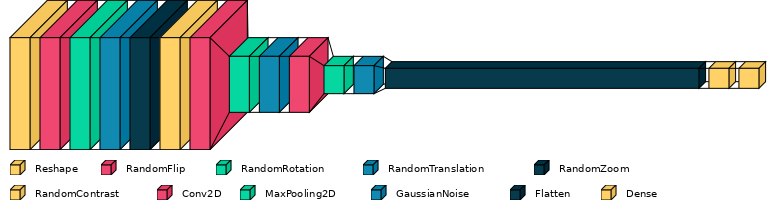

In [10]:
import visualkeras
from PIL import ImageFont

font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf", 10, encoding="unic")
# A hack to make the legend work because getsize has been removed from Pillow but visualkeras wasn't updated:
# https://github.com/tensorflow/models/issues/11040
font.getsize = lambda str: [8*len(str), 10]

visualkeras.layered_view(model, legend=True, font=font).convert('RGB')

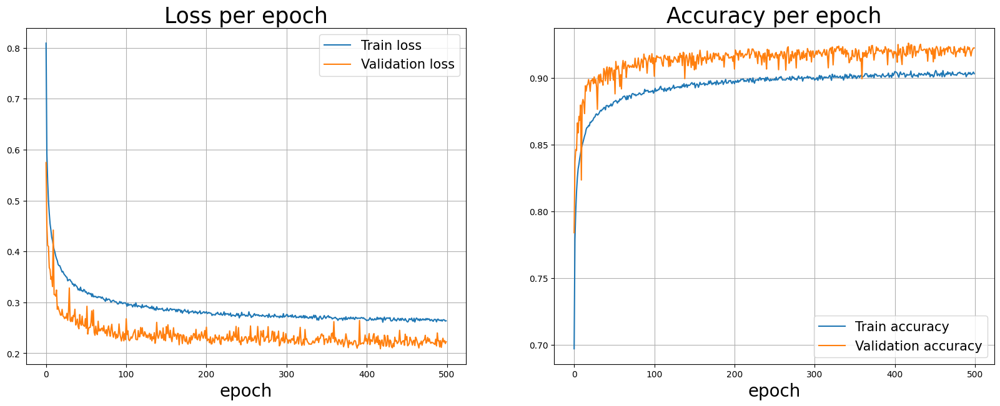

In [11]:
plot_results(history.history)

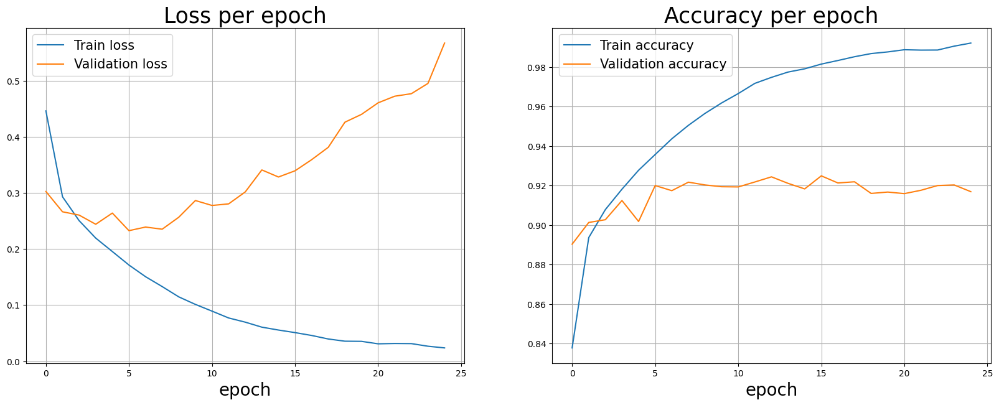

In [213]:
# Variability = 0.1 (except for Gaussian noise = 0.025)
plot_results(history.history)

In [12]:
probability_model = tf.keras.Sequential([model, 
                                         tf.keras.layers.Softmax()])

predictions = probability_model.predict(challenge_input)

challenge_result = challenge_input.copy()
challenge_result["Label"] = np.argmax(predictions, axis=1)
challenge_result["ImageId"] = range(1, len(challenge_result) + 1)
challenge_result.to_csv("cpitrat_tf_result.csv", columns=["ImageId", "Label"], index=False)

313/313 [==============================] - 2s 6ms/step


In [13]:
corrects = pd.DataFrame(challenge_result["Label"] == challenge_labels).rename(columns={0: 'ok'}).groupby("ok").size()
accuracy = 100.0*corrects.loc["True":].iloc[0] / (corrects.loc["True":].iloc[0] + corrects.loc["False":].iloc[0])

print("Accuracy: %s%%" % accuracy)

Accuracy: 92.24%


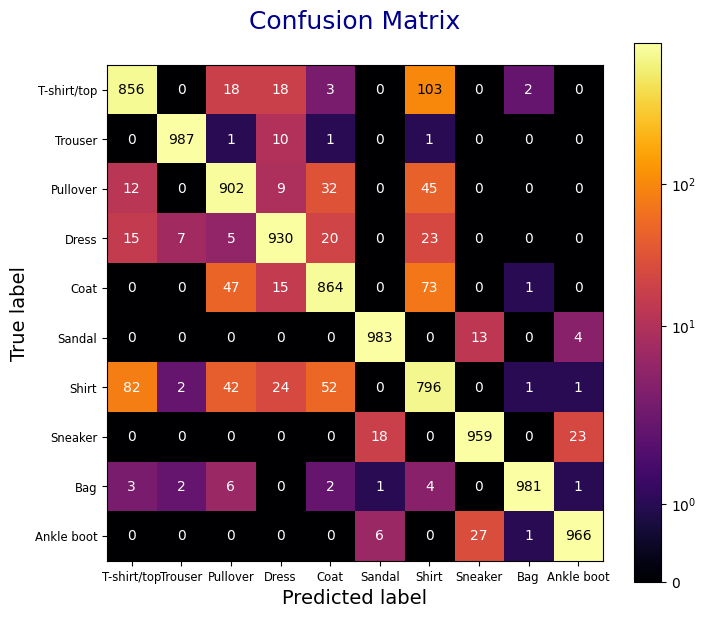

In [14]:
def plot_confusion_matrix(real, predictions, names):
    raw_confusion = tf.math.confusion_matrix(real, predictions)
    # Remove the diagonal
    #confusion = confusion - np.diag(np.diag(confusion))
    
    confusion = pd.DataFrame(
        data=raw_confusion,
        index=names,
        columns=names,
    )
    #display(confusion)
    plt.figure(figsize = (8,7), facecolor='white')
    plt.title('Confusion Matrix\n', fontsize = 18, color = 'darkblue')
    plt.ylabel('True label', fontsize = 14)
    plt.xlabel('Predicted label', fontsize = 14)
    plt.xticks(range(10), labels, size='small')
    plt.yticks(range(10), labels, size='small')
    plt.imshow(confusion, cmap='inferno', norm='symlog')
    for y, row in enumerate(raw_confusion):
        for x, v in enumerate(row):
            color = 'white' if v.numpy() < 100 else 'black'
            plt.text(x, y, v.numpy(), color=color, horizontalalignment='center', verticalalignment='center')
    plt.colorbar(ticks=[0, 1, 10, 100, 1000])
    plt.show()

# -> Predictions
# | Real labels
# V
pd.DataFrame(
    data=tf.math.confusion_matrix(challenge_labels, challenge_result["Label"]),
    index=labels,
    columns=labels,
)
plot_confusion_matrix(challenge_labels, challenge_result["Label"], labels)

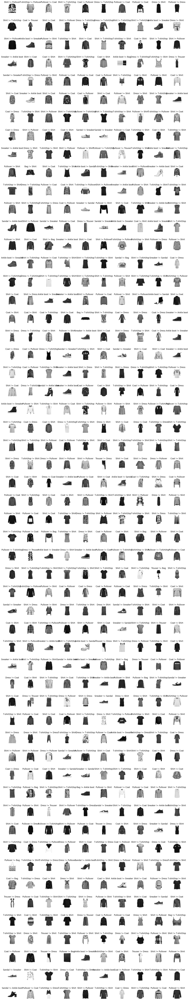

In [15]:
misclassified = challenge_result["Label"] != challenge_labels
misclassified_input = challenge_input[misclassified]
# The true label
misclassified_true_labels = challenge_labels[misclassified]
# The incorrectly predicted label
misclassified_labels = challenge_result[misclassified]["Label"]

show_items(misclassified_input, 10, 55, labels=misclassified_labels.to_numpy(), true_labels=misclassified_true_labels.to_numpy())
